Homework #2
===
* Exercise


In [2]:
from google.colab import drive
from PIL import Image
import torch
import torch.optim as optim
import torch.nn as nn
from torchvision import transforms
import numpy as np
%matplotlib inline
from matplotlib import pyplot as plt
import csv


# 구글 드라이브 마운트
drive.mount('/content/drive')

Mounted at /content/drive




##4장 
>빨강, 파랑, 초록 물건 사진을 가져와
* 이미지를 로드하고, 텐서로 변환한다.


Red item image : 


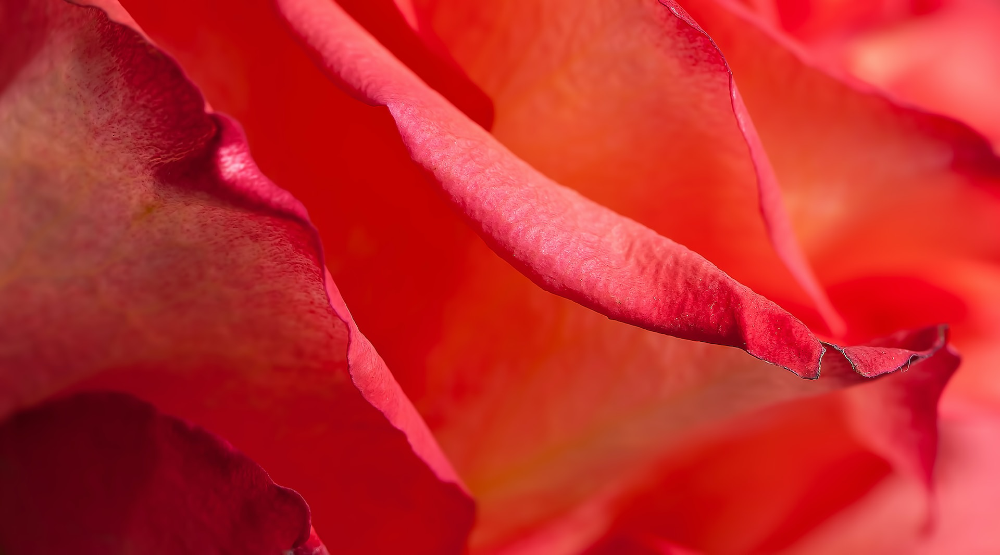

Green item image : 


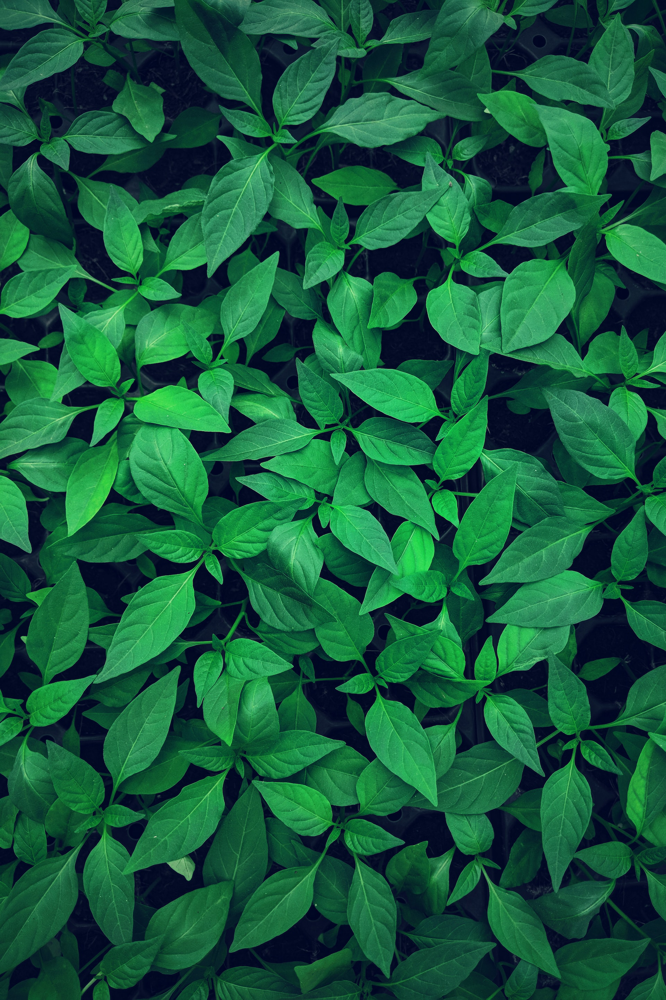

Blue item image : 


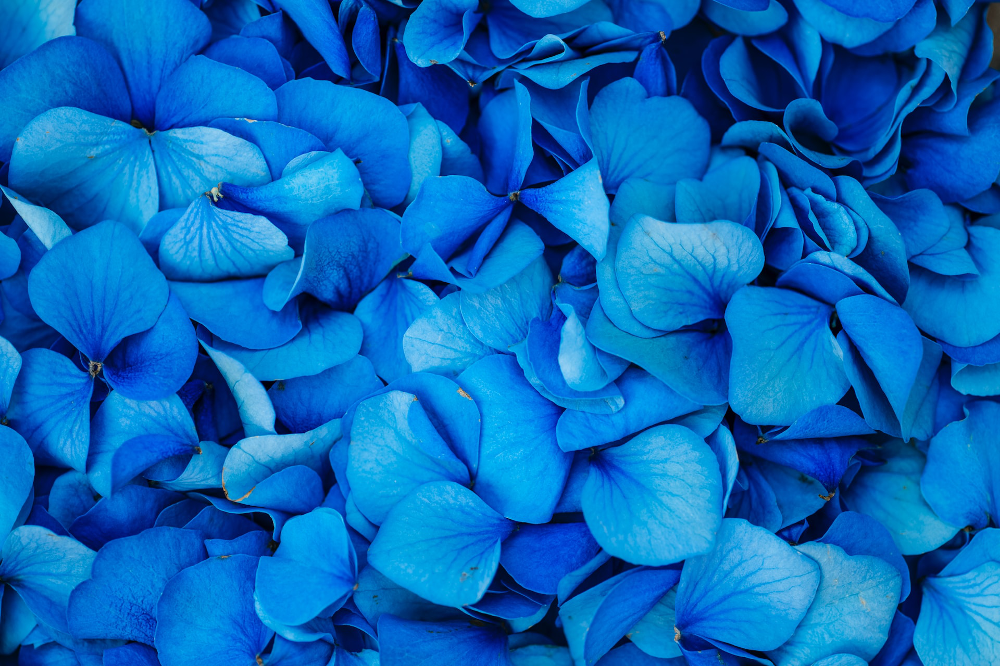

In [3]:
# 이미지 파일 경로 지정
data_dir = '/content/drive/MyDrive/ColabNotebooks23-1/data/image-color/'

# torchvision의 transforms.ToTensor를 사용하여 이미지 -> 텐서 변환 함수 생성
tf = transforms.ToTensor()

# 각 이미지를 로드 및 출력, 텐서로 변환
img = Image.open(data_dir + 'red.jpg')
print('Red item image : ')
img.show()
red_t = tf(img)

img = Image.open(data_dir + 'green.jpg')
print('Green item image : ')
img.show()
green_t = tf(img)

img = Image.open(data_dir + 'blue.jpg')
print('Blue item image : ')
img.show()
blue_t = tf(img)

In [4]:
# 텐서화 확인
red_t, green_t, blue_t

(tensor([[[0.5647, 0.5647, 0.5647,  ..., 0.8941, 0.8902, 0.8902],
          [0.5686, 0.5686, 0.5647,  ..., 0.8941, 0.8902, 0.8902],
          [0.5686, 0.5686, 0.5686,  ..., 0.8941, 0.8941, 0.8941],
          ...,
          [0.2431, 0.2431, 0.2431,  ..., 0.9843, 0.9843, 0.9843],
          [0.2431, 0.2431, 0.2431,  ..., 0.9843, 0.9843, 0.9882],
          [0.2431, 0.2431, 0.2431,  ..., 0.9882, 0.9882, 0.9882]],
 
         [[0.0275, 0.0275, 0.0275,  ..., 0.2471, 0.2431, 0.2431],
          [0.0314, 0.0314, 0.0275,  ..., 0.2471, 0.2431, 0.2431],
          [0.0314, 0.0314, 0.0314,  ..., 0.2471, 0.2471, 0.2471],
          ...,
          [0.0510, 0.0510, 0.0510,  ..., 0.4392, 0.4392, 0.4392],
          [0.0510, 0.0510, 0.0510,  ..., 0.4392, 0.4392, 0.4353],
          [0.0510, 0.0510, 0.0510,  ..., 0.4353, 0.4353, 0.4353]],
 
         [[0.0902, 0.0902, 0.0902,  ..., 0.3137, 0.3098, 0.3098],
          [0.0941, 0.0941, 0.0902,  ..., 0.3137, 0.3098, 0.3098],
          [0.0941, 0.0941, 0.0941,  ...,

>* 각 이미지별로 "*.mean()*" 메소드를 사용하여 이미지의 밝기를 확인한다.


In [5]:
# torch.mean() 을 사용하여 이미지 밝기의 평균을 구한다.
brightness_red = torch.mean(red_t)
brightness_green = torch.mean(green_t)
brightness_blue = torch.mean(blue_t)

print("Brightness of the Red image : ", brightness_red.item())
print("Brightness of the Green image : ", brightness_green.item())
print("Brightness of the Blue image : ", brightness_blue.item())

Brightness of the Red image :  0.3588925302028656
Brightness of the Green image :  0.22457244992256165
Brightness of the Blue image :  0.3891725540161133


평균적으로 0.2~0.4 사이의 값을 가진다. 0.5보다 낮은 값을 갖기에 대체로 어두운 사진이라고 할 수 있다. 그중, 초록 이미지가 0.22로 가장 어둡고, 파랑이미지가 0.39로 가장 밝다.

>* 이미지의 채널별 "*.mean()*"을 사용하여 빨강, 초록, 파랑 식별 가능성을 확인한다.



In [6]:
# torch.mean(dim to reduce = [1, 2]) 을 사용하여 1번이미지 밝기의 평균을 구한다.
brightness_c_red = torch.mean(red_t, [1, 2])
brightness_c_green = torch.mean(green_t, [1, 2])
brightness_c_blue = torch.mean(blue_t, [1, 2])

print("Brightness of the Red image [R G B]: ", brightness_c_red[0].item(), end = ", ")
print(brightness_c_red[1].item(), ", ", brightness_c_red[2].item())
print("Brightness of the Green image [R G B]: ", brightness_c_green[0].item(), end =  ", ")
print(brightness_c_green[1].item(), ", ", brightness_c_green[2].item())
print("Brightness of the Blue image [R G B]: ", brightness_c_blue[0].item(),  end = ", ")
print(brightness_c_blue[1].item(), ", ", brightness_c_blue[2].item())

ridx = torch.argmax(brightness_c_red).item()
gidx = torch.argmax(brightness_c_green).item()
bidx = torch.argmax(brightness_c_blue).item()
cdic = {0 : "Red",
        1 : "Green",
        2 : "Blue"}

print('\n')
print("The Brightest channel of the Red image : ", cdic[ridx], end = "Channel - ")
print("{:.3f}".format(brightness_c_red[ridx].item()))
print("The Brightest channel of the Green image : ", cdic[gidx], end = "Channel - ")
print("{:.3f}".format(brightness_c_green[gidx].item()))
print("The Brightest channel of the Blue image : ", cdic[bidx], end = "Channel - ")
print("{:.3f}".format(brightness_c_blue[bidx].item()))

Brightness of the Red image [R G B]:  0.7597492933273315, 0.15935450792312622 ,  0.15757374465465546
Brightness of the Green image [R G B]:  0.08431676775217056, 0.35482457280158997 ,  0.23457595705986023
Brightness of the Blue image [R G B]:  0.03100517950952053, 0.40935125946998596 ,  0.7271612286567688


The Brightest channel of the Red image :  RedChannel - 0.760
The Brightest channel of the Green image :  GreenChannel - 0.355
The Brightest channel of the Blue image :  BlueChannel - 0.727


채널별 mean()의 결과로 각 이미지에서 어떤 색이 가장 밝게 나타나는지 확인할 수 있다.
빨강, 초록, 파랑이미지는 눈으로 보기에도 빨강, 초록, 파랑이 강하게 나타남을 알 수 있고, 수치적으로도 각각의 채널이 가장 높은 값(가장 밝음)을 가짐을 확인했다.


##5장 
>모델을 [w2 * t_u^2 + w1 * t_u + b] 로 재정의하고,





In [7]:
# Unknown Temperature, Celsius Temperature
t_c = [0.5,  14.0, 15.0, 28.0, 11.0,  8.0,  3.0, -4.0,  6.0, 13.0, 21.0]
t_u = [35.7, 55.9, 58.2, 81.9, 56.3, 48.9, 33.9, 21.8, 48.4, 60.4, 68.4]
t_c = torch.tensor(t_c)
t_u = torch.tensor(t_u)

> * 훈련을 위해 적절히 변경되어야 하거나 변경되지 않아야 하는 부분들은 무엇인가?


In [8]:
# 가중치는 두개의 요소, 그리고 편차는 하나의 요소를 지닌다.
wb = torch.tensor([1, 2, 3]) # w1, w2, b

In [9]:
# 입력은 t_u, t_u**2, 1 의 형태를 갖는다.
t_u_r = torch.unsqueeze(t_u, 1)
t_u_r = torch.cat((t_u_r, t_u_r**2, torch.ones(t_u_r.size())), 1)
t_u_r

tensor([[3.5700e+01, 1.2745e+03, 1.0000e+00],
        [5.5900e+01, 3.1248e+03, 1.0000e+00],
        [5.8200e+01, 3.3872e+03, 1.0000e+00],
        [8.1900e+01, 6.7076e+03, 1.0000e+00],
        [5.6300e+01, 3.1697e+03, 1.0000e+00],
        [4.8900e+01, 2.3912e+03, 1.0000e+00],
        [3.3900e+01, 1.1492e+03, 1.0000e+00],
        [2.1800e+01, 4.7524e+02, 1.0000e+00],
        [4.8400e+01, 2.3426e+03, 1.0000e+00],
        [6.0400e+01, 3.6482e+03, 1.0000e+00],
        [6.8400e+01, 4.6786e+03, 1.0000e+00]])

In [10]:
# 재정의된 모델의 연산 예시
t_p_test = torch.sum(wb * t_u_r, 1)
t_p_test

tensor([ 2587.6802,  6308.5200,  6835.6802, 13500.1211,  6398.6797,  4834.3203,
         2335.3201,   975.2799,  4736.5200,  7359.7202,  9428.5205])

In [11]:
# 변경 : 모델 재정의
def model(t_u, wb):
    return torch.sum(wb * t_u, 1)

In [93]:
# 유지 : Loss Function
def loss_fn(t_p, t_c):
    squared_diffs = (t_p - t_c)**2
    return squared_diffs.mean()

# 유지 : 손실 함수 미분
def dloss_fn(t_p, t_c):
    dsq_diffs = 2 * (t_p - t_c) / t_p.size(0)
    return dsq_diffs

# 변경 : 가중치, 편차 미분 재정의
def dmodel_dwb(t_u, wb):
    return t_u

# 변경 : 경사 함수 재정의
def grad_fn(t_u, t_c, t_p, wb):
    dloss_dtp = dloss_fn(t_p, t_c)
    dloss_dtp = dloss_dtp.unsqueeze(1)
    dloss_dwb = dloss_dtp * dmodel_dwb(t_u, wb)
    return dloss_dwb.sum(0)

# 변경 : Training 함수 재정의 가중치와 편차 통합
def training_loop(n_epochs, learning_rate, params, t_u, t_c, print_params=True):
    for epoch in range(1, n_epochs + 1):
        wb = params    
        t_p = model(t_u, wb)  # <1>
        loss = loss_fn(t_p, t_c)
        grad = grad_fn(t_u, t_c, t_p, wb)  # <2>

        params = params - learning_rate * grad

        if epoch in {1, 2, 3, 10, 11, 99, 100, 4000, 5000}:  # <3>
            print('Epoch %d, Loss %f' % (epoch, float(loss)))
            if print_params:
                print('    Params:', params)
                print('    Grad:  ', grad)
        if epoch in {4, 12, 101}:
            print('...')

        if not torch.isfinite(loss).all():
            break  # <3>
    return params

> * 손실이 훈련 후 어떻게 변하는가?

In [94]:
%%time

# 입력요소 변환 [t_u, t_u^2, 1]
t_u_r = torch.unsqueeze(t_u, 1)
t_u_r = torch.cat((t_u_r, t_u_r**2, torch.ones(t_u_r.size())), 1)

params = training_loop(
    n_epochs = 5000, 
    learning_rate = 1e-8, 
    params = torch.tensor([1.0, 1.0, 0.0]),
    # Parameter가 (tensorsize : 3) 이 되도록 재설정
    t_u = t_u_r,
    t_c = t_c,
    print_params = False)

params

Epoch 1, Loss 11709471.000000
Epoch 2, Loss 6962912.000000
Epoch 3, Loss 4140453.500000
...
Epoch 10, Loss 109038.250000
Epoch 11, Loss 64920.402344
...
Epoch 99, Loss 204.014069
Epoch 100, Loss 204.012833
...
Epoch 4000, Loss 199.340240
Epoch 5000, Loss 198.151062
CPU times: user 493 ms, sys: 3.8 ms, total: 497 ms
Wall time: 502 ms


tensor([ 9.6692e-01, -1.1139e-02, -9.4794e-04])

손실이 훈련 후 감소한 것을 확인할 수 있다. 다만, 완벽한 지표가 될 순 없지만, 선형모델로 학습했을 경우의 손실을 참고하면, 2.927648로 2차 함수로 모델을 정의하고 학습한 현재보다 더 나은 모습을 보인다.


> * 실제 결과가 어떻게 변하는가?

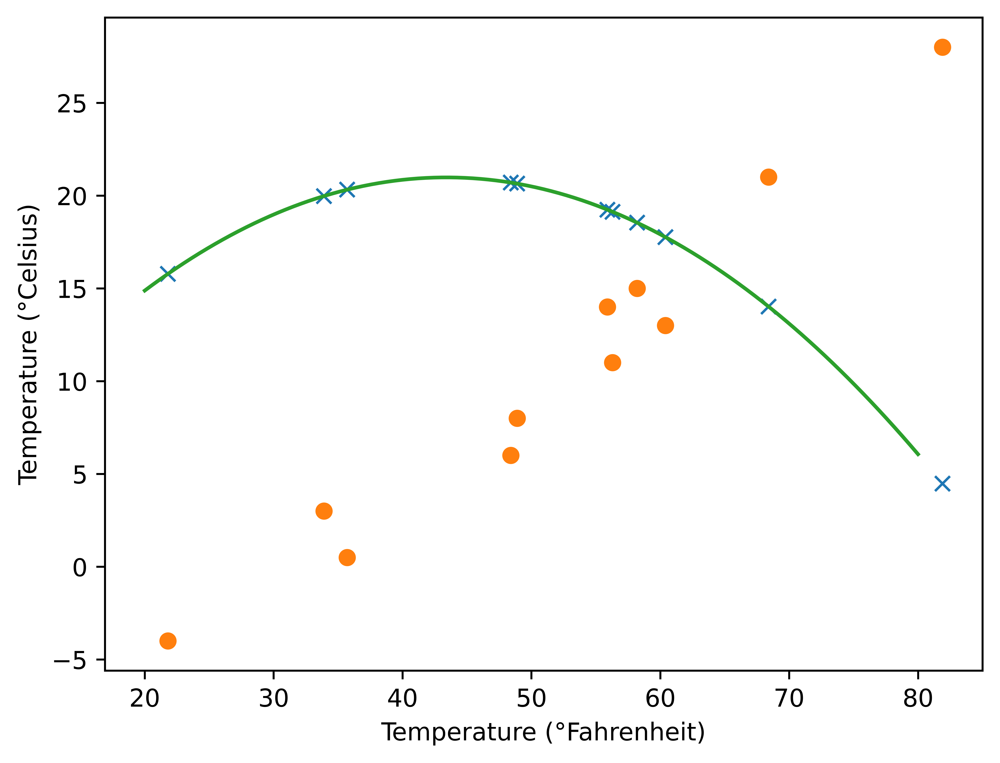

In [14]:
import sympy as sp

t_p = model(t_u_r, params)  # <1>

x = sp.Symbol('x')

f = params[0]*x + params[1]*x**2 + params[2]
f_np = sp.lambdify(x, f, 'numpy')
x_vals = np.linspace(20, 80, 100)

fig = plt.figure(dpi=1000)
plt.xlabel("Temperature (°Fahrenheit)")
plt.ylabel("Temperature (°Celsius)")
plt.plot(t_u.numpy(), t_p.numpy(), 'x') # <2>
plt.plot(t_u.numpy(), t_c.numpy(), 'o')
plt.plot(x_vals, f_np(x_vals))
plt.show()
#plt.savefig("temp_unknown_plot.png", format="png")  # bookskip

모델의 가중치가 두 요소로 변하였기에, w를 기존 1 size의 텐서에서 2 size 텐서로 변경한다.
그에 맞추어 입력은 가중치 2번 요소에 t_u^2, 가중치 1번 요소에 t_u를 매칭시키기 위해 unsqueeze를 통해 차원을 한 단계 늘리고 해당 차원으로 붙인다.
재정의된 모델은, 입력을 적절한 입력으로 바꾸는 코드가 추가되었다.


##6장 
>4장의 와인 데이터를 로드해 적절한 입력 요소를 가진 모델을 만든다.

In [15]:
# 와인 데어터 로드
wine_path = "/content/drive/MyDrive/ColabNotebooks23-1/data/winequality-white.csv"
wineq_numpy = np.loadtxt(wine_path, dtype=np.float32, delimiter=";", skiprows=1)

col_list = next(csv.reader(open(wine_path), delimiter=';'))

wineq = torch.from_numpy(wineq_numpy)

col_list, wineq.shape, wineq.dtype

(['fixed acidity',
  'volatile acidity',
  'citric acid',
  'residual sugar',
  'chlorides',
  'free sulfur dioxide',
  'total sulfur dioxide',
  'density',
  'pH',
  'sulphates',
  'alcohol',
  'quality'],
 torch.Size([4898, 12]),
 torch.float32)

In [16]:
data = wineq
data, data.shape

(tensor([[ 7.0000,  0.2700,  0.3600,  ...,  0.4500,  8.8000,  6.0000],
         [ 6.3000,  0.3000,  0.3400,  ...,  0.4900,  9.5000,  6.0000],
         [ 8.1000,  0.2800,  0.4000,  ...,  0.4400, 10.1000,  6.0000],
         ...,
         [ 6.5000,  0.2400,  0.1900,  ...,  0.4600,  9.4000,  6.0000],
         [ 5.5000,  0.2900,  0.3000,  ...,  0.3800, 12.8000,  7.0000],
         [ 6.0000,  0.2100,  0.3800,  ...,  0.3200, 11.8000,  6.0000]]),
 torch.Size([4898, 12]))

In [17]:
# data split | 훈련 80%, 검증 20%
n_samples = data.shape[0]
n_val = int(0.2 * n_samples)

shuffled_indices = torch.randperm(n_samples)

train_indices = shuffled_indices[:-n_val]
val_indices = shuffled_indices[-n_val:]

train_indices.size(), val_indices.size()

(torch.Size([3919]), torch.Size([979]))

In [18]:
# data split
data_train = data[train_indices]
data_val = data[val_indices]

data_train.size(), data_val.size()

(torch.Size([3919, 12]), torch.Size([979, 12]))

In [19]:
# 입력과 목표 분리
input_train = data_train[:, :-1]
target_train = data_train[:, -1]
input_val = data_val[:, :-1]
target_val = data_val[:, -1]

input_train.size(), target_train.size(), input_val.size(), target_val.size()

(torch.Size([3919, 11]),
 torch.Size([3919]),
 torch.Size([979, 11]),
 torch.Size([979]))

In [20]:
# 입력 데이터 정규화
# 입력 데이터에 한해서 정규화 계산.
def nom_d(data, mean, std):
  data_n = (data - mean) / std
  return data_n

data_mean = torch.mean(input_train, dim=0)
data_var = torch.var(input_train, dim=0)
data_std = torch.sqrt(data_var)

data_mean, data_var, data_std

(tensor([6.8651e+00, 2.7875e-01, 3.3454e-01, 6.4817e+00, 4.5896e-02, 3.5237e+01,
         1.3847e+02, 9.9407e-01, 3.1870e+00, 4.8760e-01, 1.0512e+01]),
 tensor([7.0890e-01, 1.0224e-02, 1.4752e-02, 2.6356e+01, 4.7884e-04, 2.7454e+02,
         1.7823e+03, 9.2068e-06, 2.2454e-02, 1.2839e-02, 1.5281e+00]),
 tensor([8.4196e-01, 1.0111e-01, 1.2146e-01, 5.1338e+00, 2.1882e-02, 1.6569e+01,
         4.2217e+01, 3.0343e-03, 1.4985e-01, 1.1331e-01, 1.2362e+00]))

In [21]:
# 입력 데이터 정규화
input_train_norm = nom_d(input_train, data_mean, data_std)
input_val_norm = nom_d(input_val, data_mean, data_std)

torch.mean(input_train_norm, dim = 0), torch.mean(input_val_norm, dim = 0)

(tensor([-2.4651e-07, -1.0513e-07, -8.7605e-08, -1.5087e-08, -1.3725e-07,
          4.9764e-08, -7.3004e-09,  6.4497e-06,  8.2081e-07, -1.7618e-07,
         -1.9322e-07]),
 tensor([-0.0613, -0.0254, -0.0145, -0.0880, -0.0282,  0.0214, -0.0125, -0.0624,
          0.0434,  0.0993,  0.0085]))

In [22]:
# 목표값 one-hot 변환
target_train = data_train[:, -1].long()
target_val = data_val[:, -1].long()

target_train_onehot = torch.zeros(target_train.shape[0], 10)
target_val_onehot = torch.zeros(target_val.shape[0], 10)

target_train_onehot.scatter_(1, target_train.unsqueeze(1), 1.0)
target_val_onehot.scatter_(1, target_val.unsqueeze(1), 1.0)

target_train_onehot.size(), target_val_onehot.size()

(torch.Size([3919, 10]), torch.Size([979, 10]))

> * 어떤 요소들이 훈련시간에 영향을 주는지 설명할 수 있는가?

In [96]:
# 와인 분류 모델
wine_model = nn.Linear(11, 10)  # input 11 ->  output 10

wine_model, wine_model(input_train_norm[0:3, :])

(Linear(in_features=11, out_features=10, bias=True),
 tensor([[ 0.6825,  1.0577, -0.2929, -0.0088, -0.7224, -0.3857, -0.1807,  0.3983,
          -0.8137, -0.5550],
         [ 0.4386, -0.1636,  0.1328,  0.2492,  0.8360, -0.4854, -0.4838,  1.1686,
          -0.7490, -0.0495],
         [ 0.2942,  0.2729,  0.3721,  0.1443,  0.1494, -0.0073, -0.1139,  0.5433,
          -0.2140, -0.3572]], grad_fn=<AddmmBackward0>))

1) 모델 : 와인 분류모델의 경우, 입력이 11개, 출력이 10개 이므로 그만큼 온도모델에 비하여 파라미터가 더 많다. 또한, one-hot으로 설정된 목표로 분류하기위해 cross-entropy 손실과 softmax를 계산해야하기 때문에, 더 많은 연산을 필요로한다.

2) 데이터 : wine 모델의 경우, 가져온 훈련 데이터셋의 형태가 3919, 10으로 10가지 종류의 정보를 가지는 3919개의 와인 샘플이 존재한다. 따라서 한 학습에 겨우 11개의 데이터를 쓰는 온도모델보다 더 많은 시간이 필요하다.

In [97]:
def training_loop(epoch, optim, model, loss_fn, train_u, train_t, val_u, val_t):
    for epoch in range(1, epoch + 1):
        train_p = model(train_u)
        loss_train = loss_fn(train_p, train_t)

        val_p = model(val_u)
        loss_val = loss_fn(val_p, val_t)
        
        optimizer.zero_grad()
        loss_train.backward()
        optimizer.step()

        if epoch == 1 or epoch % 1000 == 0:
            print(f"Epoch {epoch}, Training loss {loss_train.item():.4f},"
                  f" Validation loss {loss_val.item():.4f}")



> * 훈련을 하면서 손실을 줄일 수 있는가?
> * 온도 데이터와 비교했을 때 교육 시간이 얼마나 걸리는가?

In [98]:
%%time

wine_loss_fn = nn.CrossEntropyLoss()

optimizer = optim.Adam(
    wine_model.parameters(), # <2>
    lr=1e-2)

training_loop(epoch = 10000,
              optim = optimizer,
              model = wine_model,
              loss_fn = wine_loss_fn,
              train_u = input_train_norm,
              train_t = target_train_onehot,
              val_u = input_val_norm,
              val_t = target_val_onehot)

Epoch 1, Training loss 2.7307, Validation loss 2.7136
Epoch 1000, Training loss 1.0823, Validation loss 1.1509
Epoch 2000, Training loss 1.0747, Validation loss 1.1511
Epoch 3000, Training loss 1.0727, Validation loss 1.1549
Epoch 4000, Training loss 1.0717, Validation loss 1.1582
Epoch 5000, Training loss 1.0711, Validation loss 1.1613
Epoch 6000, Training loss 1.0707, Validation loss 1.1645
Epoch 7000, Training loss 1.0705, Validation loss 1.1675
Epoch 8000, Training loss 1.0704, Validation loss 1.1702
Epoch 9000, Training loss 1.0703, Validation loss 1.1725
Epoch 10000, Training loss 1.0703, Validation loss 1.1745
CPU times: user 17.4 s, sys: 42.2 ms, total: 17.4 s
Wall time: 17.6 s


훈련 손실과 평가 손실 모두 감소하는 것을 확인할 수 있다. 

위의 온도데이터 모델의 학습을 확인하면 502ms, 즉, 0.5초 가량 만에 완료된것을 확인할 수 있고, 이번 와인데이터 모델의 학습을 확인하면, 17초 가량으로 30배 이상의 시간이 소모된 것을 확인할 수 있다.

> * 어떻게 그래프로 나타낼 수 있는가?

In [110]:
# 각 샘플별 실제 와인 점수와, 예측 와인 점수
y = wine_model(input_val_norm)
y = y.detach().numpy()
pred = np.zeros(y.shape[0])

# onehot -> 0~9 점 스케일링
for i in range(pred.shape[0]):
  pred[i] = np.argmax(y[i, :])

true = target_val.detach().numpy()

true[:10], pred[:10]

(array([5, 5, 5, 5, 5, 6, 7, 5, 5, 8]),
 array([5., 6., 5., 6., 5., 5., 7., 6., 5., 6.]))

In [111]:
# label 도출
set_true = set(true)
set_pred = set(pred)

label = set_true.union(set_pred)
labels = list(label)
labels

[3, 4, 5, 6, 7, 8, 9.0]

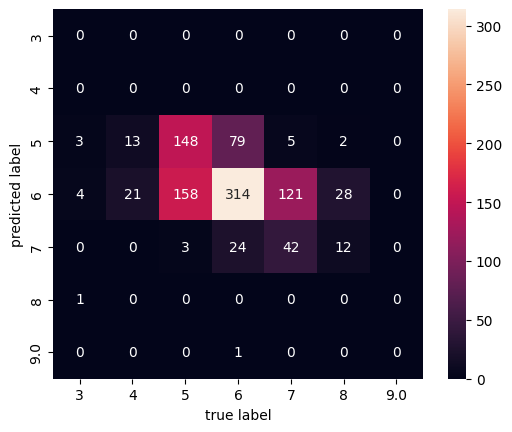

In [112]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

mat = confusion_matrix(true, pred) #혼동행렬 생성
sns.heatmap(mat.T, xticklabels = labels, yticklabels = labels, square=True, annot=True, fmt='d')
plt.xlabel('true label')
plt.ylabel('predicted label');

sklearn 라이브러리와 seaborn 라이브러리를 사용하여 Confusion Matrix 형태로 시각화 할 수 있다.